# Assignment 1
Name: Yifan Luo

UID: u7351505

## Task 1: Basic Image I/O

In [66]:
import numpy as np
import matplotlib.pyplot as plt
import skimage
import cv2
from PIL import Image

Read the original images.

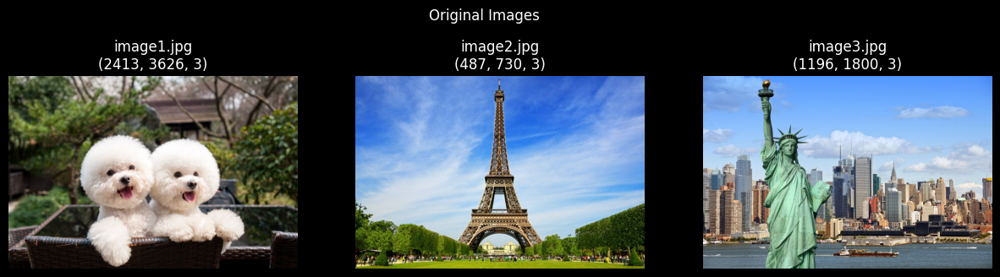

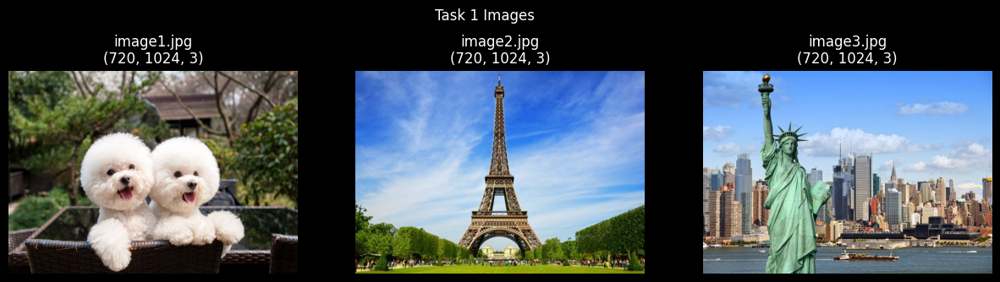

In [67]:
img_path = "./figures"
img_names = ["image1.jpg", "image2.jpg", "image3.jpg"]


def read_rgb_imgs(path, names):
    """Read images from the input path.
    All images will be read by OpenCV and converted to RGB format.

    Args:
        path (str): The image path.
        names (List[str]): The image names.
    Returns:
        imgs_rgb (List[numpy.ndarray]): The returned RGB images.
    """
    imgs_rgb = []
    for n in names:
        # OpenCV reads images in BGR format
        img_bgr = cv2.imread(path + '/' + n)
        # Convert BGR list format to RGB array format
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        img_rgb = np.array(img_rgb)
        imgs_rgb.append(img_rgb)
    return imgs_rgb

       
# The original images
imgs_rgb_original = read_rgb_imgs(img_path, img_names)
# The images after being resized to 1024 columns and 720 rows
imgs_rgb = [cv2.resize(img, (1024, 720)) for img in imgs_rgb_original]


def plot_imgs(imgs, suptitle, names=img_names, grayscale=False, figsize=(15, 4)):
    """Plot the images from Task 1 and 2.

    Args:
        imgs (numpy.ndarray): RGB images in array format.
        suptitle (str): The title of the plot.
        names (List[str], optional): The names of images. Defaults to img_names.
        grayscale (boolean, optional): The switch of plotting method. Defaults to False.
        figsize (Tuple[numpy.ndarray]): The figure size.
    """
    fig, ax = plt.subplots(1, len(imgs), figsize=figsize)
    for i, img in enumerate(imgs):
        if grayscale:
            if img.ndim == 3:
                # Plot RGB images as grayscale images
                ax[i].imshow(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY), cmap='gray')
            else:
                # Plot separated channels as grayscale images
                ax[i].imshow(img, cmap='gray')
        else:
            ax[i].imshow(img)
        ax[i].set_title(names[i] + '\n' + str(img.shape))
        ax[i].set_axis_off()
    fig.suptitle(suptitle)

# Plot the original images
plot_imgs(imgs_rgb_original, "Original Images")
# Plot the resized images
plot_imgs(imgs_rgb, "Task 1 Images")

Resize all images into 384 columns * 256 rows.

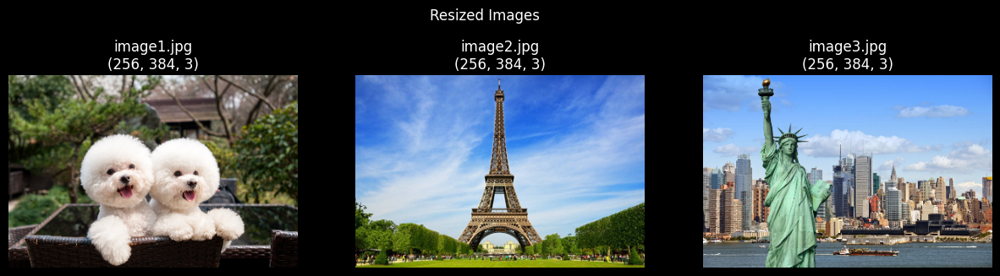

In [68]:
imgs_rgb_resized = []
for img in imgs_rgb:
    img_resized = cv2.resize(img, (384, 256))
    imgs_rgb_resized.append(img_resized)

# Plot the resized images
plot_imgs(imgs_rgb_resized, "Resized Images")

Separate RGB images into R, G and B channels, then display each channel as a grayscale image.

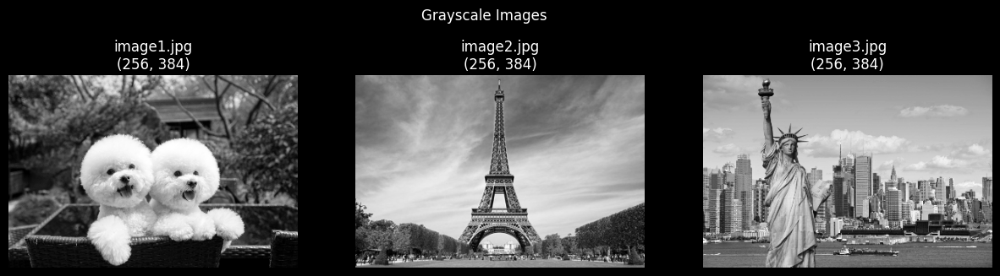

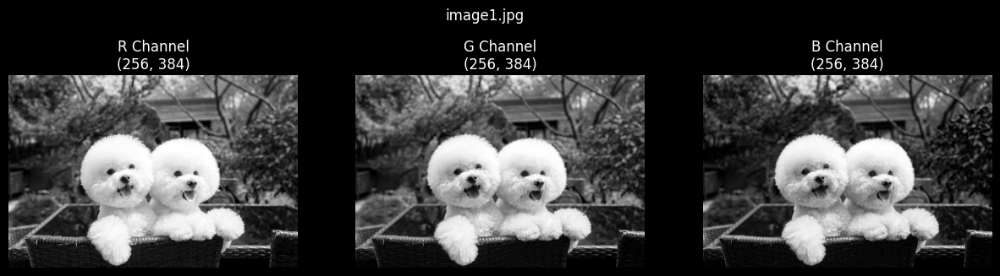

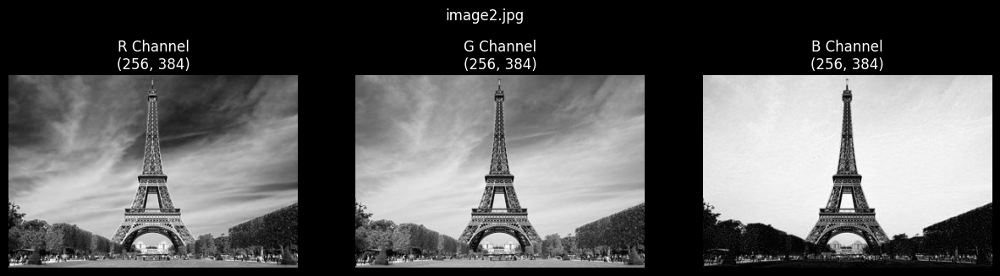

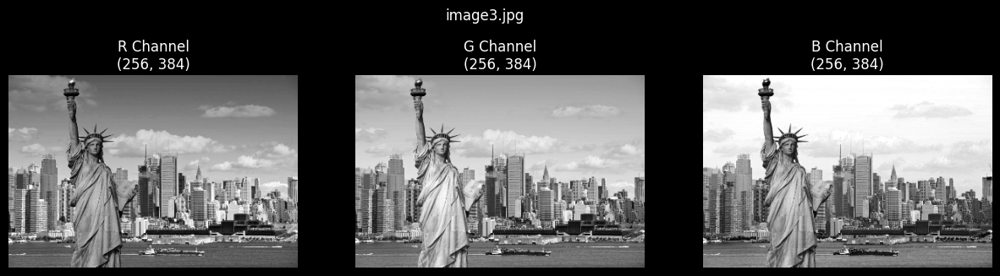

In [69]:
# Each elements (picture) contains a group of separated R, G, B channels
imgs_rgb_separated = []
for img in imgs_rgb_resized:
    img_channels = np.array([img[:, :, c] for c in range(3)])
    imgs_rgb_separated.append(img_channels)


# Convert resized RGB images into grayscale images
imgs_gray_resized = [cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) for img in imgs_rgb_resized]
# Plot grayscale images in Task 1
plot_imgs(imgs_gray_resized, "Grayscale Images", img_names, grayscale=True)


# Plot separated R, G, B channels of each image
for i, name in enumerate(img_names):
    plot_imgs(imgs_rgb_separated[i], name, ["R Channel", "G Channel", "B Channel"], grayscale=True)

Compute and display histograms for grayscale images.

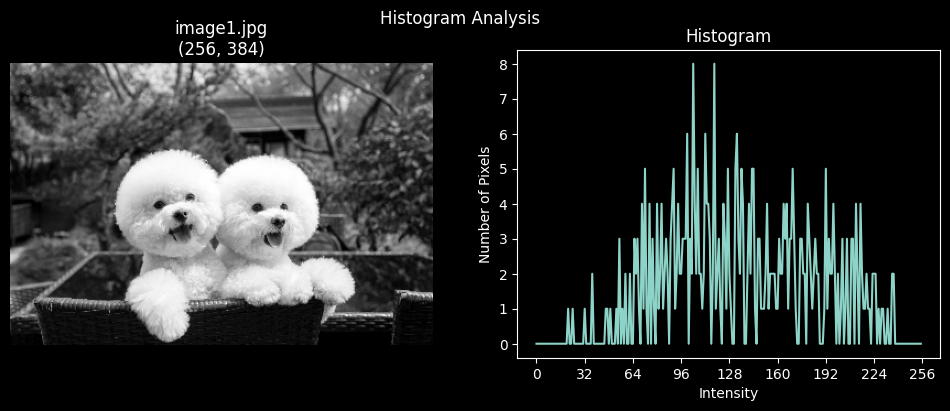

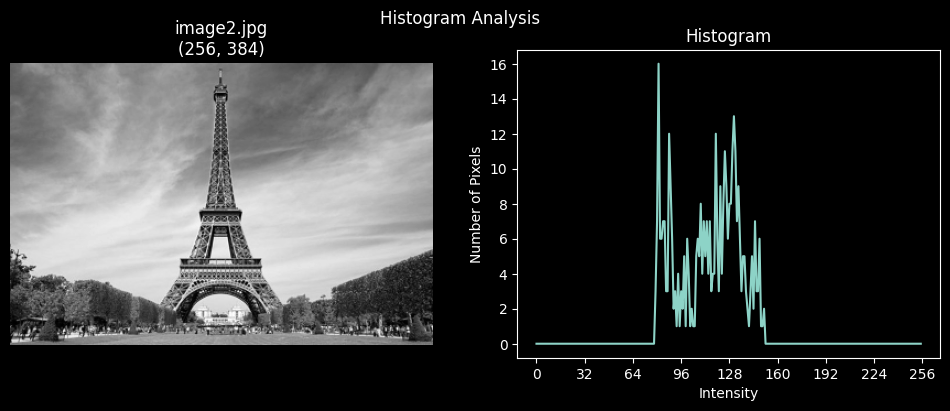

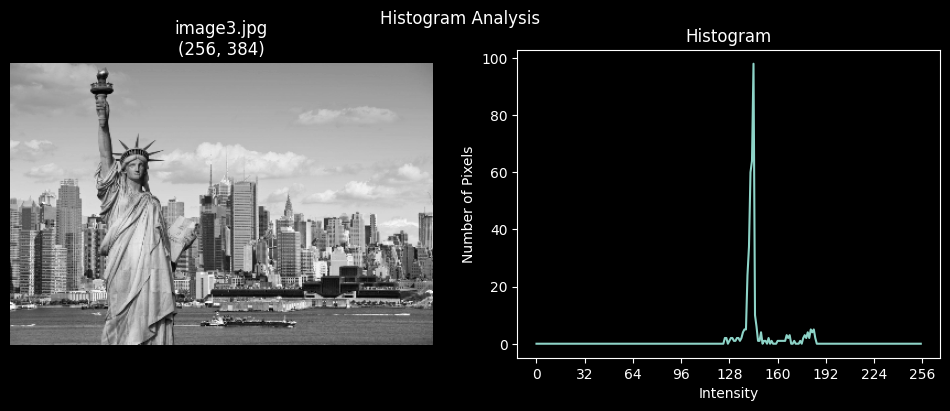

In [70]:
# Compute a histogram for each grayscale image
imgs_gray_hists = []
for i in range(len(imgs_gray_resized)):
    hist = cv2.calcHist(imgs_gray_resized[i], [0], None, [256], [0, 256])
    imgs_gray_hists.append(hist)


def plot_hist(img, hist, names, suptitle="Histogram Analysis", figsize=(12, 4)):
    """Plot histograms for grayscale images.

    Args:
        img (List[numpy.ndarray]): The input grayscale images.
        hist (numpy.ndarray): The corresponding histograms.
        names (List[str]): The corresponding plot names.
        suptitle (str, optional): The title of the plot. Defaults to "Histogram Analysis".
        figsize (tuple, optional): The figure size. Defaults to (12, 4).
    """
    fig, ax = plt.subplots(1, 2, figsize=figsize)
    # Plot the original image
    if img.ndim == 3:
        pass
        # Plot RGB images as grayscale images
        # ax[i].imshow(cv2.cvtColor(img, cv2.COLOR_RGB2GRAY), cmap='gray')
    else:
        # Plot grayscale images
        ax[0].imshow(img, cmap='gray')
    ax[0].set_title(names[0] + '\n' + str(img.shape))
    ax[0].set_axis_off()
    # Plot the histogram
    ax[1].plot(hist)
    ax[1].set_title(names[1])
    ax[1].set_xlabel("Intensity")
    ax[1].set_ylabel("Number of Pixels")
    ax[1].set_xticks(np.linspace(0, len(hist), 9))
    fig.suptitle(suptitle)
    
    
for i, h in enumerate(imgs_gray_hists):
    plot_hist(imgs_gray_resized[i], h, [img_names[i], "Histogram"])

Apply histogram equalisation.

In [71]:
def hist_equal(img):
    """Histogram equalisation on each channel by using self-implement function.

    Args:
        img (List[numpy.ndarray]): The input separated channels in the format of (C, W, H).

    Returns:
        numpy.ndarray: The output image in the format of (C, W, H).
    """
    channels_eq = []
    for i in range(3):
        # Calculate the histogram
        histogram = [0] * 256
        for pixel_value in img[i].flatten():
            histogram[pixel_value] += 1
        # Calculate the CDF
        cdf = [sum(histogram[:i+1]) for i in range(256)]
        # Normalize the CDF
        total = len(img[i].flatten())
        cdf_norm = [int((cdf[i] / total) * 255) for i in range(256)]
        # Map pixel values using the normalized CDF
        channel_eq = [[cdf_norm[pixel] for pixel in row] for row in img[i]]
        channels_eq.append(channel_eq)
    return np.array(channels_eq, dtype=np.uint8)


# imgs_rgb_separated_he[0][0] represents the equalised R channel of"image1.jpg"
imgs_rgb_separated_he = []
for img in imgs_rgb_separated:
    img_rgb_he = hist_equal(img)
    imgs_rgb_separated_he.append(img_rgb_he)


def hist_equal_cv(img_rgb_separated):
    """Histogram equalisation on each channel by using built-in function.

    Args:
        img_rgb_separated (List[numpy.ndarray]): The input separated channels in the format of (C, W, H).

    Returns:
        numpy.ndarray: The output image in the format of (C, W, H).
    """
    # Histogram equalisation for each channel
    r = cv2.equalizeHist(img_rgb_separated[0])
    g = cv2.equalizeHist(img_rgb_separated[1])
    b = cv2.equalizeHist(img_rgb_separated[2])
    return np.array([r, g, b], dtype=np.uint8)


imgs_rgb_separated_he_cv = []
for img in imgs_rgb_separated:
    img_rgb_he_cv = hist_equal_cv(img)
    imgs_rgb_separated_he_cv.append(img_rgb_he_cv)


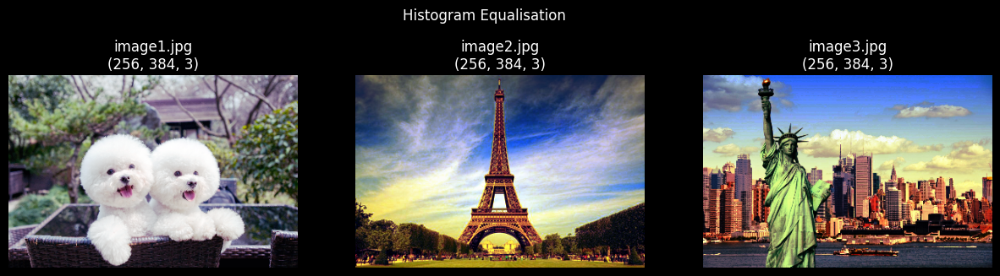

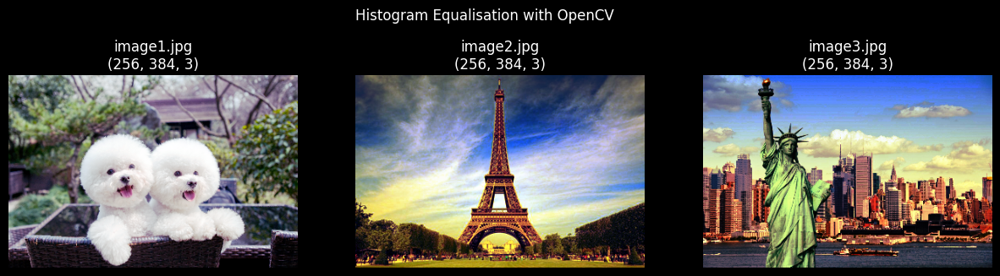

In [72]:
# imgs_rgb_he[0] represent the RGB channels (after HE) of "image1.jpg"
imgs_rgb_he = []
for i in range(len(imgs_rgb_separated_he)):
    # Rearrange axes from (C, W, H) format to (W, H, C) format
    imgs_rgb_he.append(np.moveaxis(imgs_rgb_separated_he[i], 0, -1))
plot_imgs(imgs_rgb_he, "Histogram Equalisation", names=img_names)


imgs_rgb_he_cv = []
for i in range(len(imgs_rgb_separated_he_cv)):
    # Rearrange axes from (C, W, H) format to (W, H, C) format
    imgs_rgb_he_cv.append(np.moveaxis(imgs_rgb_separated_he_cv[i], 0, -1))
plot_imgs(imgs_rgb_he_cv, "Histogram Equalisation with OpenCV", names=img_names)

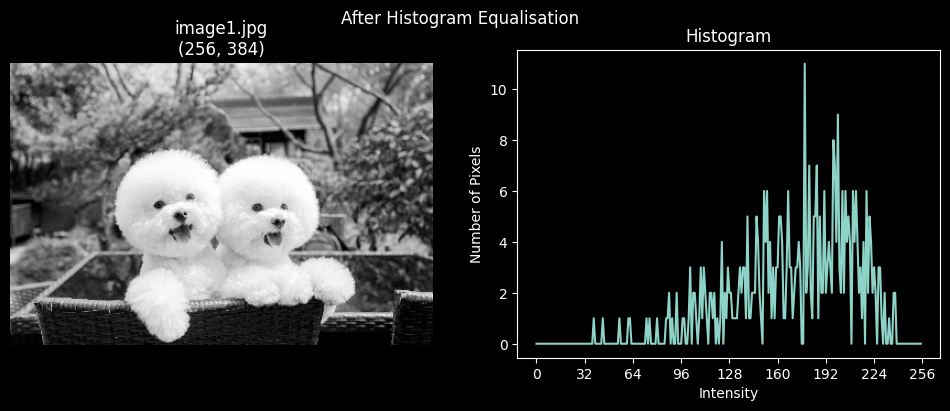

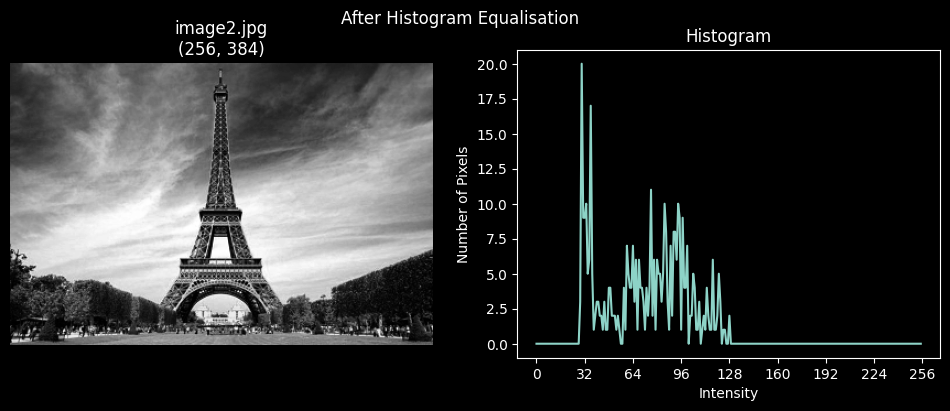

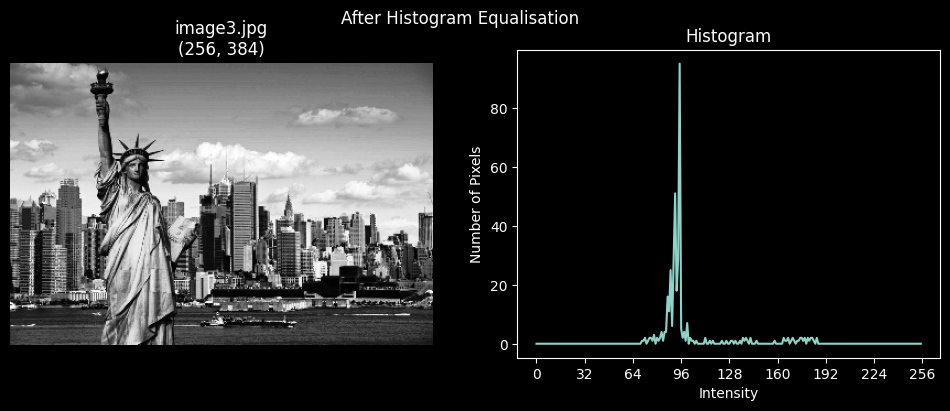

In [73]:
imgs_gray_he = [cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) for img in imgs_rgb_he]
imgs_gray_he_hists = [cv2.calcHist(img, [0], None, [256], [0, 256]) for img in imgs_gray_he]

for i, h in enumerate(imgs_gray_he_hists):
    plot_hist(imgs_gray_he[i], h, [img_names[i], "Histogram"], suptitle="After Histogram Equalisation")

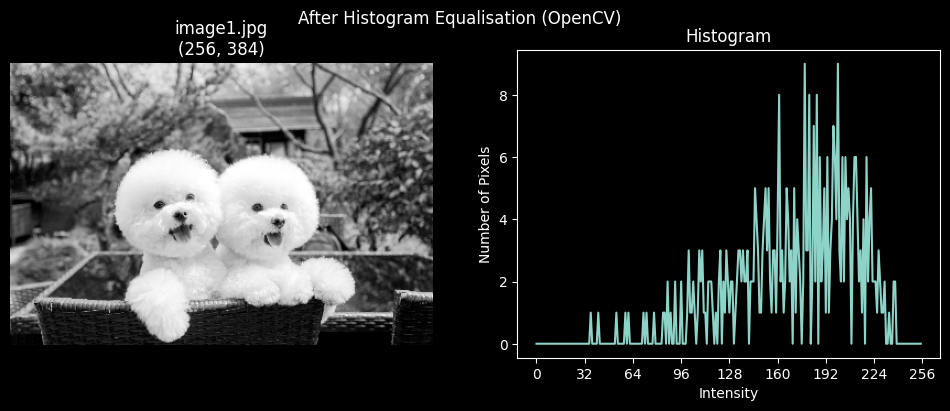

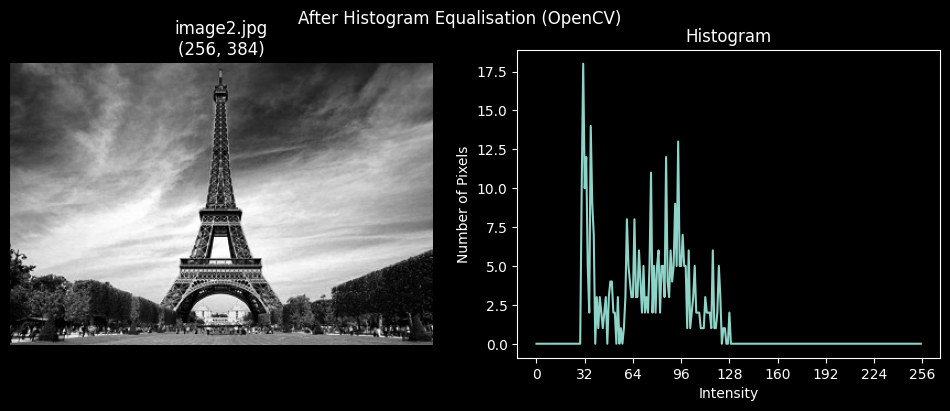

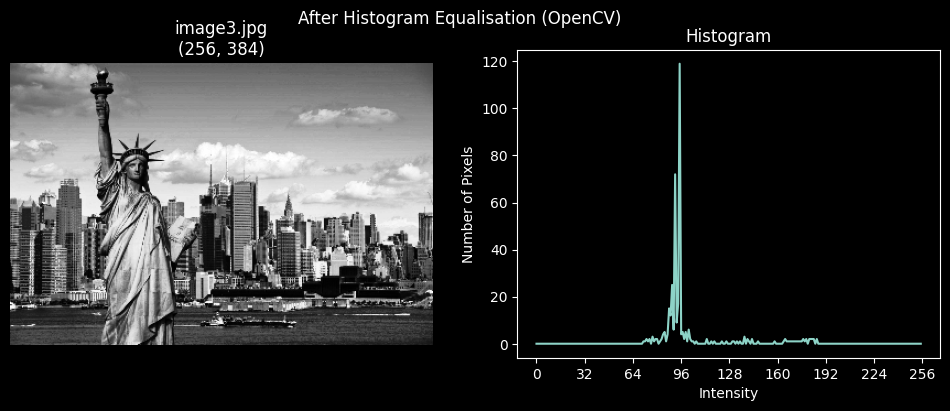

In [74]:
imgs_gray_he_cv = [cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) for img in imgs_rgb_he_cv]
imgs_gray_he_hists_cv = [cv2.calcHist(img, [0], None, [256], [0, 256]) for img in imgs_gray_he_cv]

for i, h in enumerate(imgs_gray_he_hists_cv):
    plot_hist(imgs_gray_he_cv[i], h, [img_names[i], "Histogram"], suptitle="After Histogram Equalisation (OpenCV)")

## Task 2: Colour Space Conversion

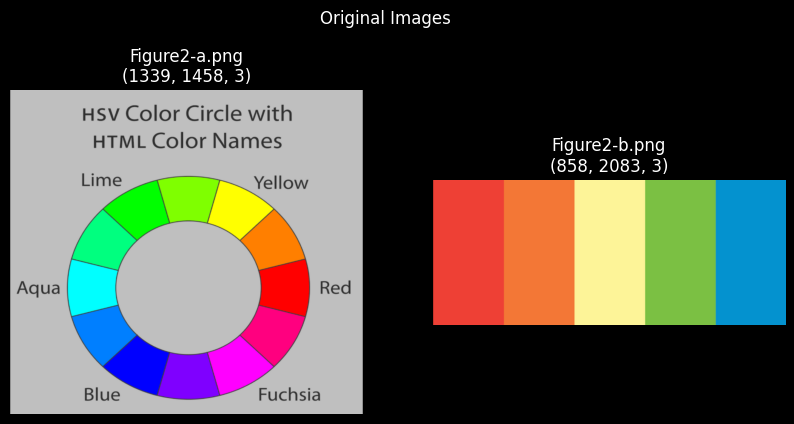

In [75]:
img_path = "./figures"
img_names = ["Figure2-a.png", "Figure2-b.png"]

# Read images into a list of RGB arrays
rgb_imgs = read_rgb_imgs(img_path, img_names)
plot_imgs(rgb_imgs, "Original Images", img_names, figsize=(10, 5))

Convert RGB pictures into HSV format by using `cvRGB2HSV`, `OpenCV` and `scikit-image`.

/var/folders/rw/0mq3h5p529gbgwxcwp876ljr0000gn/T/ipykernel_85410/2841706984.py:18: RuntimeWarning: invalid value encountered in divide
  S = delta / V
/var/folders/rw/0mq3h5p529gbgwxcwp876ljr0000gn/T/ipykernel_85410/2841706984.py:23: RuntimeWarning: invalid value encountered in divide
  H[r_mask] = (rgb_img[r_mask, 1] - rgb_img[r_mask, 2]) / delta[r_mask]
/var/folders/rw/0mq3h5p529gbgwxcwp876ljr0000gn/T/ipykernel_85410/2841706984.py:25: RuntimeWarning: invalid value encountered in divide
  H[g_mask] = 2. + (rgb_img[g_mask, 2] - rgb_img[g_mask, 0]) / delta[g_mask]
/var/folders/rw/0mq3h5p529gbgwxcwp876ljr0000gn/T/ipykernel_85410/2841706984.py:27: RuntimeWarning: invalid value encountered in divide
  H[b_mask] = 4. + (rgb_img[b_mask, 0] - rgb_img[b_mask, 1]) / delta[b_mask]


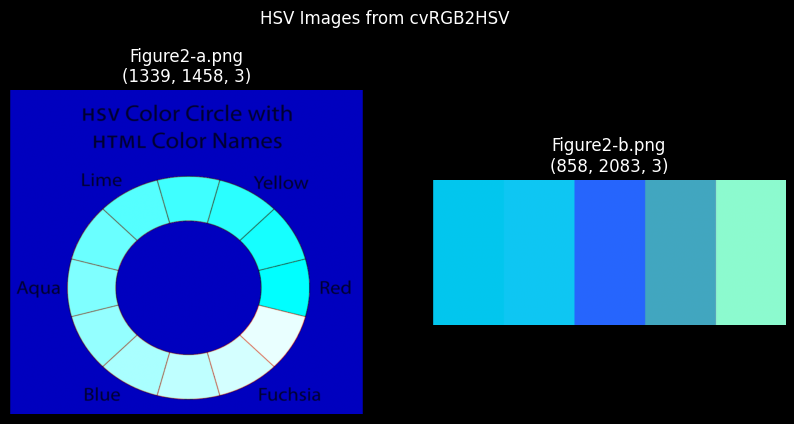

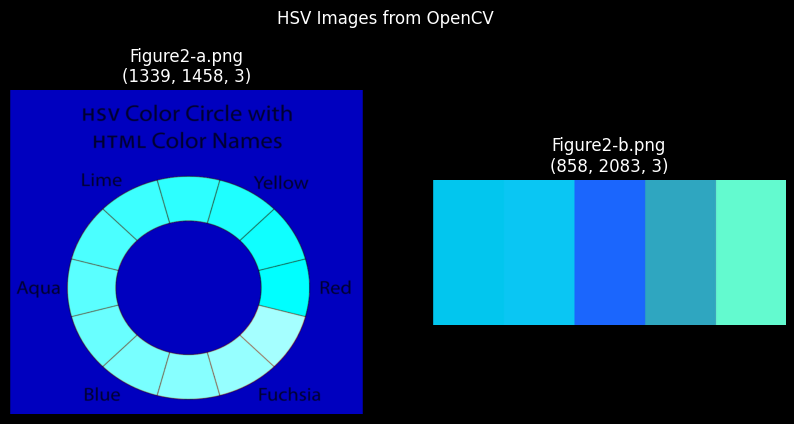

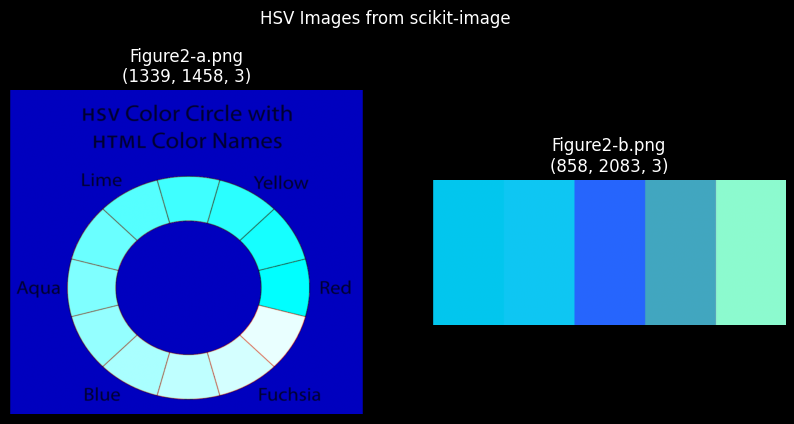

In [76]:
def cvRGB2HSV(rgb_imgs):
    """The self-implement function for transforming RGB images into HSV images.

    Args:
        rgb_imgs (List[numpy.ndarray]): The input RGB images.

    Returns:
        hsv_imgs (List[numpy.ndarray]): The output HSV images.
    """
    hsv_imgs = []
    for rgb_img in rgb_imgs:
        # Normalisation into the range [0, 255]
        rgb_img = rgb_img / 255.0
        # V channel
        V = rgb_img.max(axis=-1)
        # S channel
        delta = rgb_img.ptp(axis=-1)
        S = delta / V
        S[delta == 0.] = 0.
        # H channel
        H = np.empty_like(V)
        r_mask = (rgb_img[..., 0] == V)
        H[r_mask] = (rgb_img[r_mask, 1] - rgb_img[r_mask, 2]) / delta[r_mask]
        g_mask = (rgb_img[..., 1] == V)
        H[g_mask] = 2. + (rgb_img[g_mask, 2] - rgb_img[g_mask, 0]) / delta[g_mask]
        b_mask = (rgb_img[..., 2] == V)
        H[b_mask] = 4. + (rgb_img[b_mask, 0] - rgb_img[b_mask, 1]) / delta[b_mask]
        H = (H / 6.) % 1.
        H[delta == 0.] = 0.
        # HSV image
        hsv_img = np.stack([H, S, V], axis=-1)
        hsv_img[np.isnan(hsv_img)] = 0  # Remove NaNs
        hsv_imgs.append(hsv_img)
    return hsv_imgs


hsv_imgs = cvRGB2HSV(rgb_imgs)
plot_imgs(hsv_imgs, "HSV Images from cvRGB2HSV", img_names, figsize=(10, 5))


# Transform by using OpenCV
hsv_imgs_cv2 = []
for path in [img_path + '/' + name for name in img_names]:
    bgr_img = cv2.imread(path)
    hsv_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2HSV)
    hsv_imgs_cv2.append(hsv_img)
plot_imgs(hsv_imgs_cv2, "HSV Images from OpenCV", img_names, figsize=(10, 5))


# Transform by using scikit-image
from skimage import color
hsv_imgs_si = []
for rgb_img in rgb_imgs:
    hsv_img = color.rgb2hsv(rgb_img)
    hsv_imgs_si.append(hsv_img)
plot_imgs(hsv_imgs_si, "HSV Images from scikit-image", img_names, figsize=(10, 5))

H, S and V channels from HSV transformations by using `cvRGB2HSV`, `OpenCV` and `scikit-imagge`.

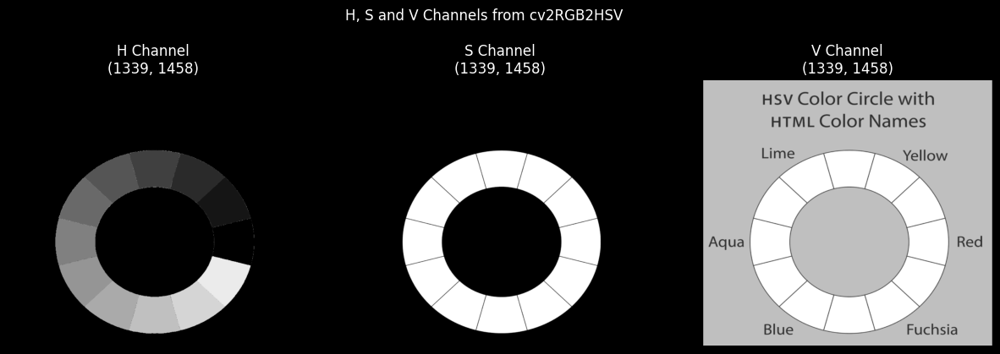

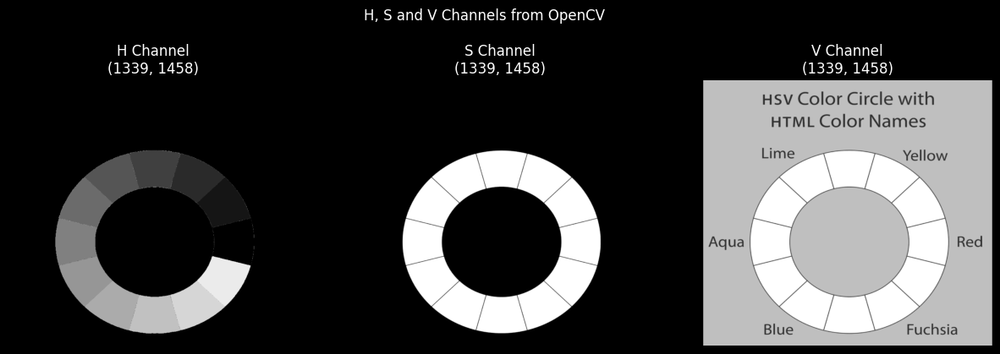

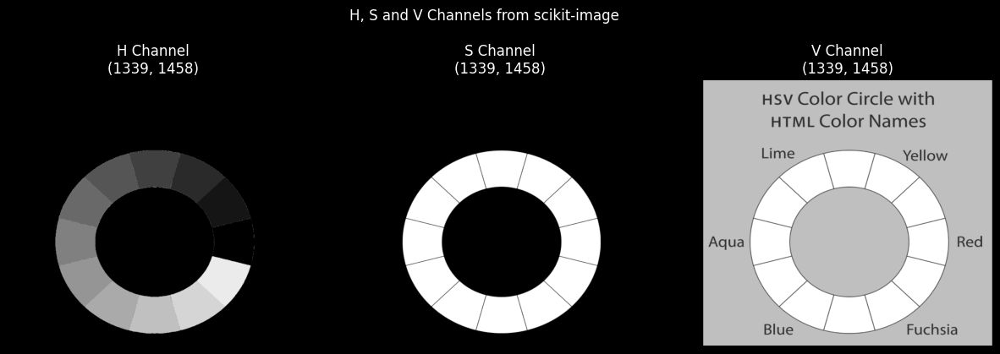

In [77]:
H, S, V = hsv_imgs[0][..., 0], hsv_imgs[0][..., 1], hsv_imgs[0][..., 2]
plot_imgs([H, S, V], "H, S and V Channels from cv2RGB2HSV", [c+" Channel" for c in "HSV"], grayscale=True, figsize=(15, 5))

H_cv2, S_cv2, V_cv2 = hsv_imgs_cv2[0][..., 0], hsv_imgs_cv2[0][..., 1], hsv_imgs_cv2[0][..., 2]
plot_imgs([H_cv2, S_cv2, V_cv2], "H, S and V Channels from OpenCV", [c+" Channel" for c in "HSV"], grayscale=True, figsize=(15, 5))

H_si, S_si, V_si = hsv_imgs_si[0][..., 0], hsv_imgs_si[0][..., 1], hsv_imgs_si[0][..., 2]
plot_imgs([H_si, S_si, V_si], "H, S and V Channels from scikit-image", [c+" Channel" for c in "HSV"], grayscale=True, figsize=(15, 5))

Compute the average hue values of `Figure2-b.png` with `cvRGB2HSV` and `scikit-image`.

In [78]:
print("Average hue values of Figure2-b.png\ncvRGB2HSV:", 
      hsv_imgs[1][..., 0].mean(),
      "\nscikit-image:", 
      hsv_imgs_si[1][..., 0].mean())

Average hue values of Figure2-b.png
cvRGB2HSV: 0.20505668323745524 
scikit-image: 0.20505668323745524


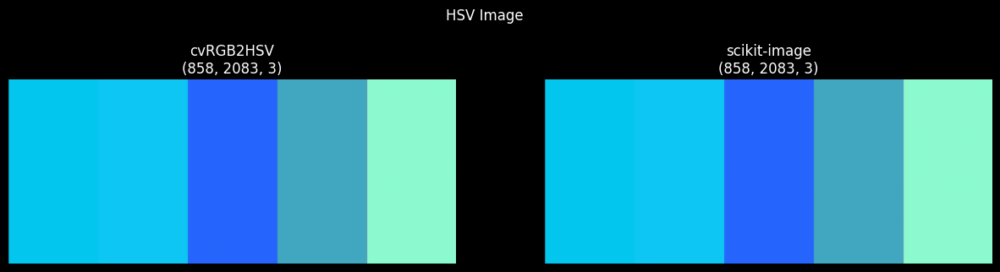

In [79]:
plot_imgs([hsv_imgs[1], hsv_imgs_si[1]], "HSV Image", ["cvRGB2HSV", "scikit-image"])

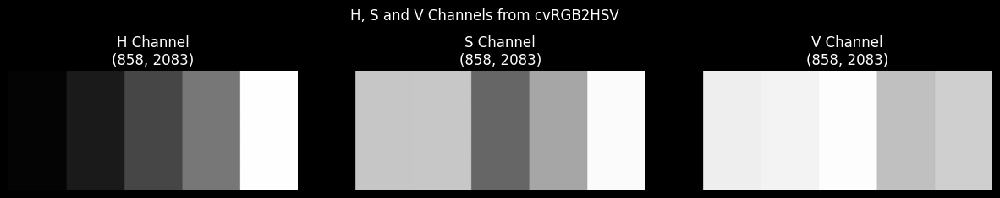

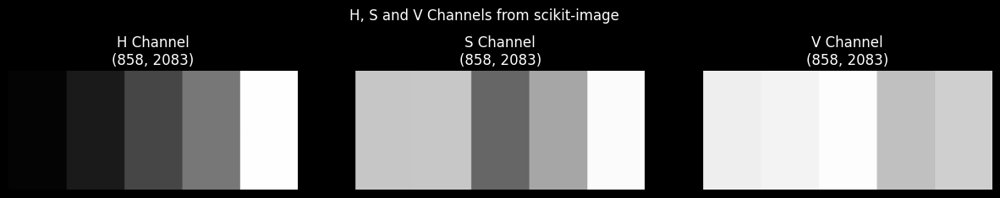

In [80]:
H, S, V = hsv_imgs[1][..., 0], hsv_imgs[1][..., 1], hsv_imgs[1][..., 2]
plot_imgs([H, S, V], "H, S and V Channels from cvRGB2HSV", [c+" Channel" for c in "HSV"], grayscale=True, figsize=(15, 3))

H, S, V = hsv_imgs_si[1][..., 0], hsv_imgs_si[1][..., 1], hsv_imgs_si[1][..., 2]
plot_imgs([H, S, V], "H, S and V Channels from scikit-image", [c+" Channel" for c in "HSV"], grayscale=True, figsize=(15, 3))

Mask off each colour to separate each area.

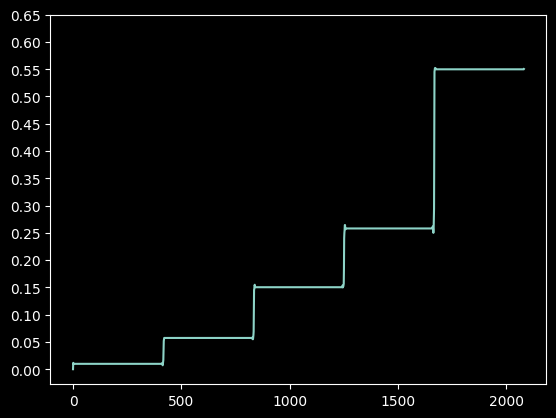

In [81]:
plt.plot(H[0])
plt.yticks(np.arange(0, 0.7, 0.05))
plt.show()

Text(0.5, 0.98, 'Hue Images with Colour Masking')

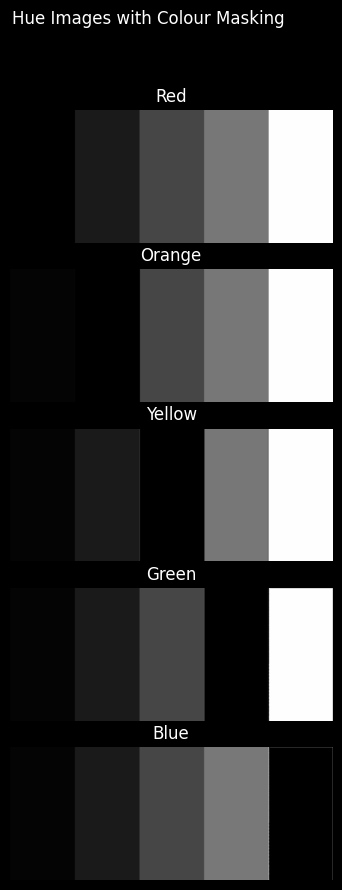

In [82]:
mask_range = [0, 0.05, 0.15, 0.25, 0.55, 1]
colours = ["Red", "Orange", "Yellow", "Green", "Blue"]

fig, ax = plt.subplots(5, 1, figsize=(18, 10))
for i in range(len(mask_range) - 1):
    hue = np.copy(H)
    hue[(mask_range[i] < hue) & (hue < mask_range[i + 1])] = 0
    img = np.stack([hue, S, V], axis=-1)
    ax[i].imshow(hue, cmap='gray')
    ax[i].set_title(colours[i])
    ax[i].set_axis_off()
fig.suptitle("Hue Images with Colour Masking")

Compute the average hue values.

In [83]:
print("The average hue value from all pixels:", hue[0].mean())
print("The average hue value from 5 samples:", (hue[0, 100] + hue[0, 500] + hue[0, 1000] + hue[0, 1500] + hue[0, 2000]) / 5)

The average hue value from all pixels: 0.2027485380966361
The average hue value from 5 samples: 0.20508075392642117


## Task 3: Image Denoising via a Gaussian Filter

Read image and show the RGB/grayscale central parts.

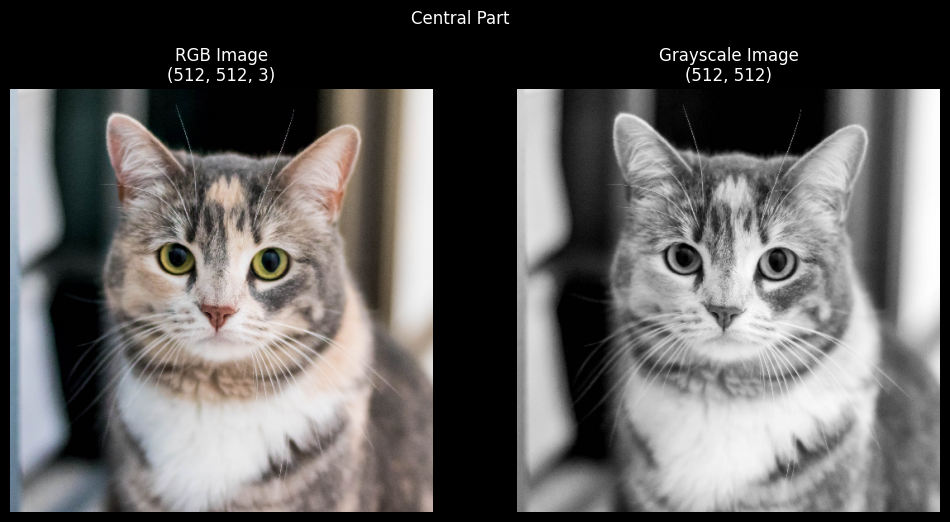

In [84]:
# Load the original image
img_path = './figures'
img_name = ["image4.jpg"]
rgb_img = np.squeeze(read_rgb_imgs(img_path, img_name))

# Crop the central facial part and resize
rgb_img_central = rgb_img[:, 891:4453, :]
rgb_img_central = cv2.resize(rgb_img_central, (512, 512))
# Transform to a garyscale image
gs_img_central = cv2.cvtColor(rgb_img_central, cv2.COLOR_RGB2GRAY)


def plot_rgb_gs(imgs, suptitle, names):
    """Plot RGB images and its grayscale image.

    Args:
        imgs (List[numpy.ndarray]): A list of RGB or grayscale pictures.
        suptitle (str): The title of the plot.
        names (List[str]): The corresponding names for each picture.
    """
    fig, ax = plt.subplots(1, len(imgs), figsize=(12, 6))
    for i, img in enumerate(imgs):
        if img.ndim == 3: # RGB images
            ax[i].imshow(img)
            ax[i].set_title("RGB Image\n" + str(img.shape))
        else:  # Grayscale image
            ax[i].imshow(img, cmap='gray')
            ax[i].set_title("Grayscale Image\n" + str(img.shape))
        ax[i].set_axis_off()
    fig.suptitle(suptitle)
    
    
plot_rgb_gs([rgb_img_central, gs_img_central], "Central Part", ["RGB Image", "Grayscale Image"])

Add Gaussian noise with $0$ mean and $15$ standard deviation.

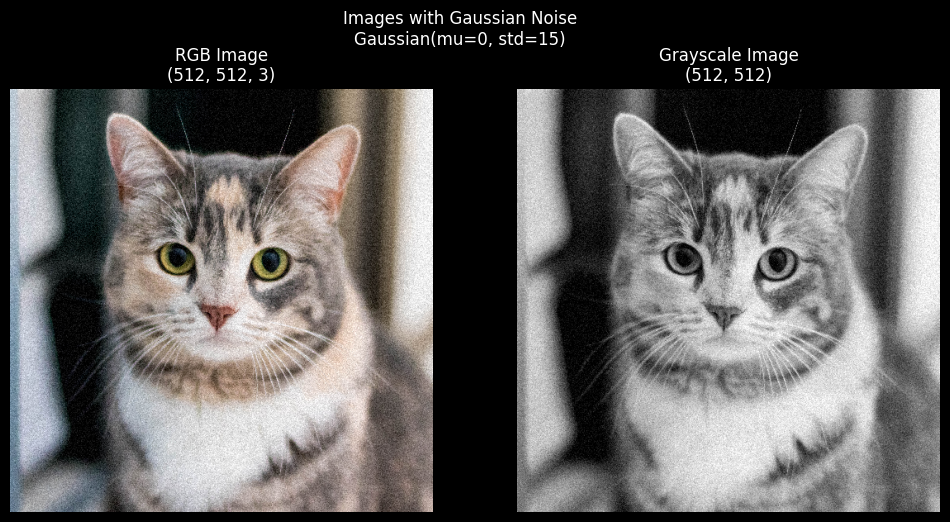

In [85]:
noise = np.random.normal(0.0, 15.0, (512, 512))

# Add noise to the RGB image
noisy_rgb_img = rgb_img_central + noise[..., np.newaxis]
noisy_rgb_img[noisy_rgb_img < 0] = 0.0
noisy_rgb_img[noisy_rgb_img > 255] = 255.0
noisy_rgb_img = noisy_rgb_img.astype(np.uint8)

# Add noise to the grayscale image
noisy_gs_img = gs_img_central + noise
noisy_gs_img[noisy_gs_img < 0] = 0.0
noisy_gs_img[noisy_gs_img > 255] = 255.0
noisy_gs_img = noisy_gs_img.astype(np.uint8)

plot_rgb_gs([noisy_rgb_img, noisy_gs_img], "Images with Gaussian Noise\nGaussian(mu=0, std=15)", 
            ["Noisy RGB Image", "Noisy Grayscale Image"])

Plot and compare histograms of the original image and the noisy image.

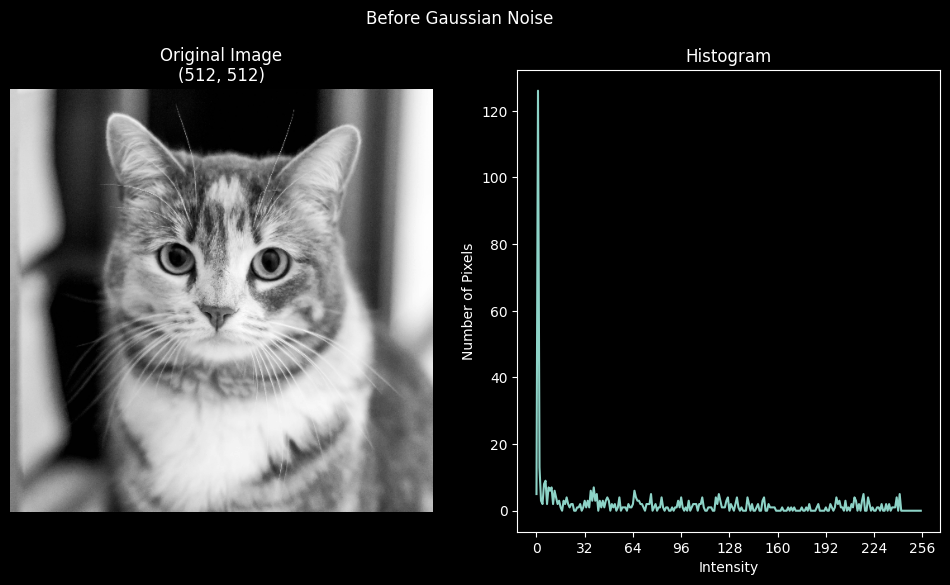

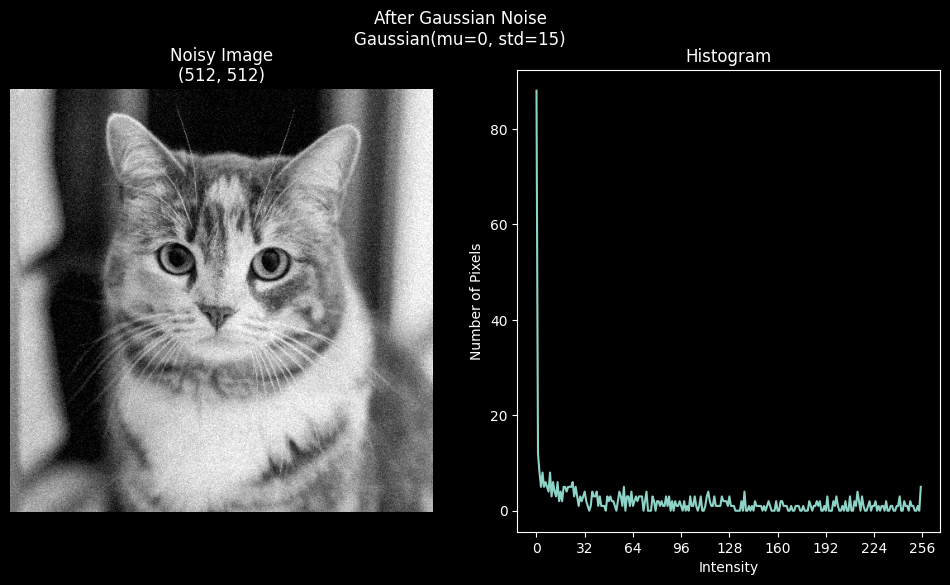

In [86]:
hist = cv2.calcHist(gs_img_central, [0], None, [256], [0, 256])
noisy_hist = cv2.calcHist(noisy_gs_img, [0], None, [256], [0, 256])

plot_hist(gs_img_central, hist, ["Original Image", "Histogram"], "Before Gaussian Noise", figsize=(12, 6))
plot_hist(noisy_gs_img, noisy_hist, ["Noisy Image", "Histogram"], "After Gaussian Noise\nGaussian(mu=0, std=15)", figsize=(12, 6))

Gaussian filter operation.

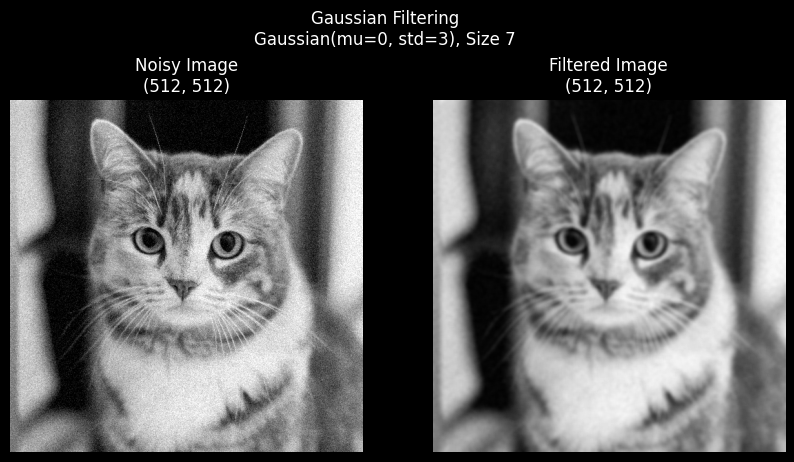

In [87]:
def gauss_kernel(mu=0, std=15, size=7):
    """Generate a Guassian kernel.

    Args:
        mu (int, optional): The mean of Gaussian distribution. Defaults to 0.
        std (int, optional): The sigma of Gaussian distribution. Defaults to 15.
        size (int, optional): The size of the kernel. Defaults to 7.

    Returns:
        kernel (numpy.ndarray): Generated Gaussian kernel.
    """
    kernel = np.fromfunction(lambda x, y: (1/(2*np.pi*std**2)) * np.exp(-((x-(size-1)/2)**2 + (y-(size-1)/2)**2)/(2*std**2)), (size, size))
    kernel /= np.sum(kernel)
    return kernel

# Generate a Gaussian kernel
kernel = gauss_kernel(0, 3, 7)

def my_Gauss_filter(noisy_img, gauss_kernel):
    """Gaussian filtering operation.

    Args:
        noisy_img (numpy.ndarray): The input noisy grayscale image.
        gauss_kernel (numpy.ndarray): The input Gaussian kernel.

    Returns:
        clean_img (numpy.ndarray): The image after Gaussian filtering.
    """
    gauss_kernel /= np.sum(gauss_kernel)  # normalisation
    
    clean_img = np.empty_like(noisy_img)
    
    padding_size = gauss_kernel.shape[0] // 2
    noisy_img_padded = np.pad(noisy_img, ((padding_size, padding_size), (padding_size, padding_size)), mode='edge')

    for i in range(padding_size, noisy_img_padded.shape[0] - padding_size):
        for j in range(padding_size, noisy_img_padded.shape[1] - padding_size):
            neighbour = noisy_img_padded[i - padding_size:i + padding_size + 1, j - padding_size:j + padding_size + 1]
            clean_img[i - padding_size, j - padding_size] = np.sum(neighbour * gauss_kernel)
    
    return clean_img

# Apply Gaussian filtering operation
clean_gs_img = my_Gauss_filter(noisy_gs_img, kernel)

plot_imgs([noisy_gs_img, clean_gs_img], "Gaussian Filtering\nGaussian(mu=0, std=3), Size 7", ["Noisy Image", "Filtered Image"], grayscale=True, figsize=(10, 5.5))

Compare with other Gaussian kernels with different standard deviations. Compare with `cv2.GaussianBlur` from OpenCV.

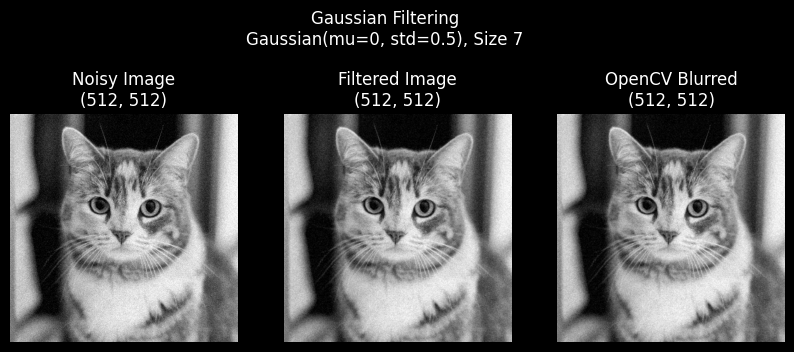

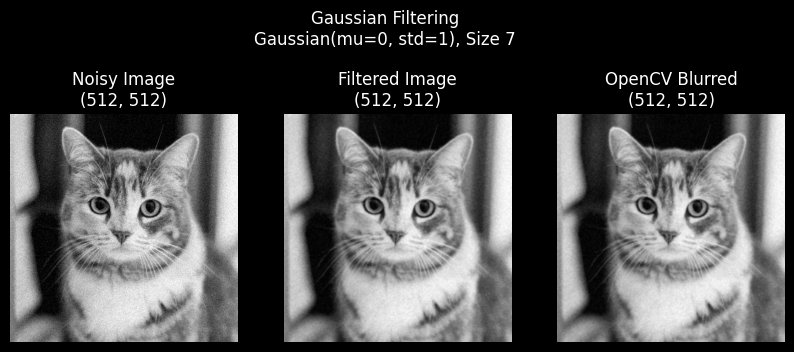

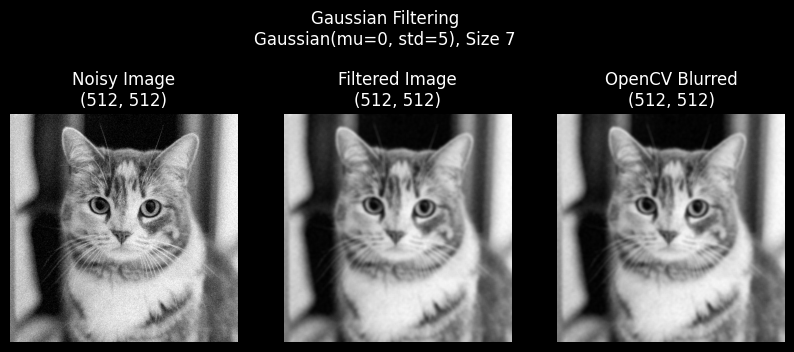

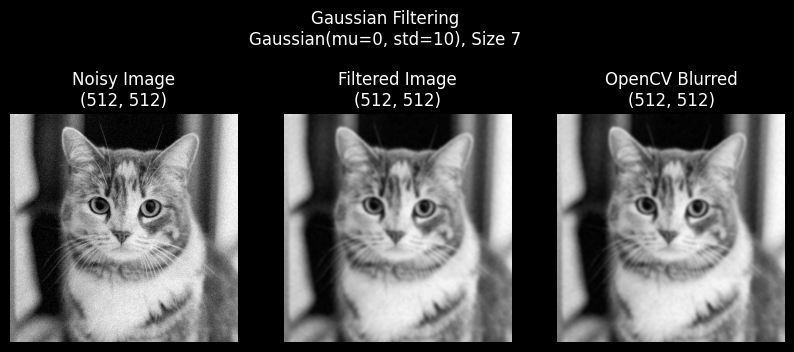

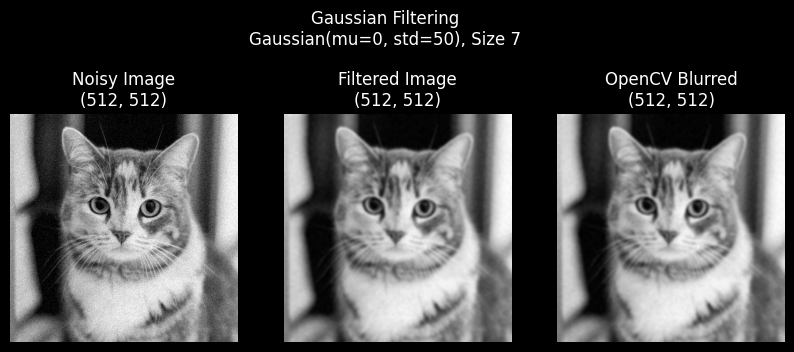

In [88]:
names = ["Noisy Image", "Filtered Image", "OpenCV Blurred"]

gs_std_0_5 = my_Gauss_filter(noisy_gs_img, gauss_kernel(0, 0.5, 7))
gs_gb_0_5 = cv2.GaussianBlur(noisy_gs_img, (7, 7), 0.5, 0.5)
plot_imgs([noisy_gs_img, gs_std_0_5, gs_gb_0_5], "Gaussian Filtering\nGaussian(mu=0, std=0.5), Size 7", 
          names, grayscale=True, figsize=(10, 4.5))

gs_std_1 = my_Gauss_filter(noisy_gs_img, gauss_kernel(0, 1, 7))
gs_gb_1 = cv2.GaussianBlur(noisy_gs_img, (7, 7), 1, 1)
plot_imgs([noisy_gs_img, gs_std_1, gs_gb_1], "Gaussian Filtering\nGaussian(mu=0, std=1), Size 7", 
          names, grayscale=True, figsize=(10, 4.5))

gs_std_5 = my_Gauss_filter(noisy_gs_img, gauss_kernel(0, 5, 7))
gs_gb_5 = cv2.GaussianBlur(noisy_gs_img, (7, 7), 5, 5)
plot_imgs([noisy_gs_img, gs_std_5, gs_gb_5], "Gaussian Filtering\nGaussian(mu=0, std=5), Size 7", 
          names, grayscale=True, figsize=(10, 4.5))

gs_std_10 = my_Gauss_filter(noisy_gs_img, gauss_kernel(0, 10, 7))
gs_gb_10 = cv2.GaussianBlur(noisy_gs_img, (7, 7), 10, 10)
plot_imgs([noisy_gs_img, gs_std_10, gs_gb_10], "Gaussian Filtering\nGaussian(mu=0, std=10), Size 7", 
          names, grayscale=True, figsize=(10, 4.5))

gs_std_50 = my_Gauss_filter(noisy_gs_img, gauss_kernel(0, 50, 7))
gs_gb_50 = cv2.GaussianBlur(noisy_gs_img, (7, 7), 50, 50)
plot_imgs([noisy_gs_img, gs_std_50, gs_gb_50], "Gaussian Filtering\nGaussian(mu=0, std=50), Size 7", 
          names, grayscale=True, figsize=(10, 4.5))

In [89]:
# Compare pixel values in element-wise with a absolute tolerance
print("Std. 0.5:", np.allclose(gs_std_0_5, gs_gb_0_5, atol=7))
print("Std. 1:", np.allclose(gs_std_1, gs_gb_1, atol=12))
print("Std. 5:", np.allclose(gs_std_5, gs_gb_5, atol=13))
print("Std. 10:", np.allclose(gs_std_10, gs_gb_10, atol=14))
print("Std. 50:", np.allclose(gs_std_50, gs_gb_50, atol=13))


Std. 0.5: False
Std. 1: False
Std. 5: True
Std. 10: True
Std. 50: True


## Task 4: Sobel Edge Filter

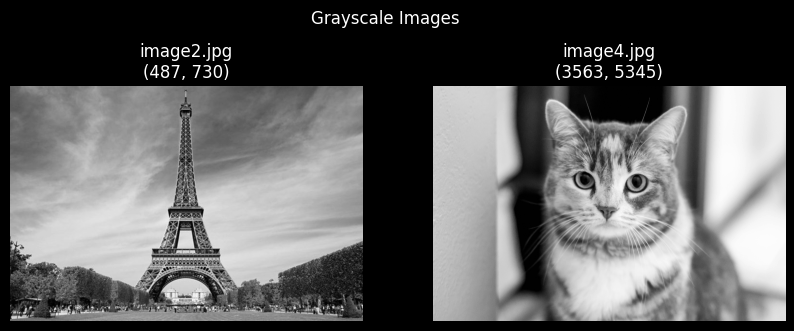

In [90]:
img_path = './figures'
img_names = ["image2.jpg", "image4.jpg"]

rgb_imgs = read_rgb_imgs(img_path, img_names)
gs_imgs = [cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) for img in rgb_imgs]
plot_imgs(gs_imgs, "Grayscale Images", img_names, grayscale=True, figsize=(10, 4))

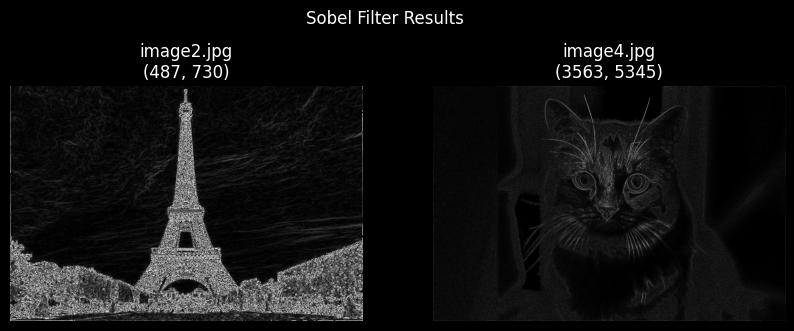

In [91]:
def sobel_edge_filter(gs_imgs):
    """Sobel edge filtering operation on a grayscale image.

    Args:
        gs_imgs (List[numpy.ndarray]): The input grayscale images.

    Returns:
        grad_magnitude (List[numpy.ndarray]): The gradient magnitude approximation results.
    """
    filter_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    filter_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
    grad_magnitude = []
    for img in gs_imgs:
        grad = np.zeros_like(img)  # grad. magnitude
        img_padded = np.pad(img, ((1, 1), (1, 1)), mode='constant')
        for i in range(1, img_padded.shape[0] - 1):
            for j in range(1, img_padded.shape[1] - 1): 
                neighbour = img_padded[i - 1:i + 1 + 1, j - 1:j + 1 + 1]
                G_x = np.sum((filter_x * neighbour))**2  # Horizontal filtering
                G_y = np.sum((filter_y * neighbour))**2  # Vertical filtering
                grad[i - 1, j - 1] = np.sqrt(G_x + G_y)  # Compute magnitude
        grad_magnitude.append(grad)
    return grad_magnitude


grad_mag = sobel_edge_filter(gs_imgs)
plot_imgs(grad_mag, "Sobel Filter Results", img_names, grayscale=True, figsize=(10, 4))

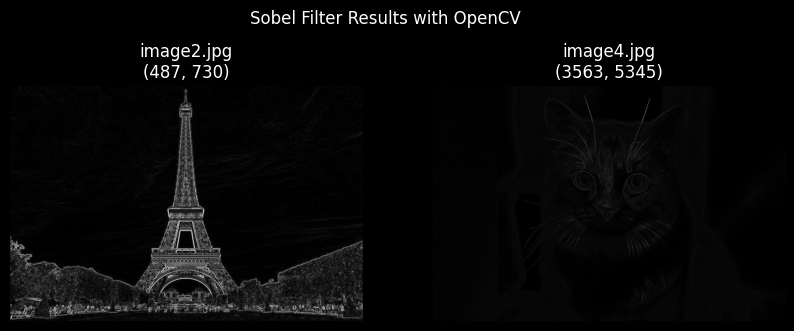

In [92]:
grad_mag_cv = []
grad_ori_cv = []
for name in img_names:
    path = img_path + '/' + name
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    # Apply Sobel filter to the image
    sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)  # Horizontal gradient (Sobel_x)
    sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)  # Vertical gradient (Sobel_y)
    # Compute the magnitude of the gradient
    mag = cv2.magnitude(sobel_x, sobel_y)
    ori = cv2.phase(sobel_x, sobel_y, angleInDegrees=True)
    grad_mag_cv.append(mag)
    grad_ori_cv.append(ori)
    
plot_imgs(grad_mag_cv, "Sobel Filter Results with OpenCV", img_names, grayscale=True, figsize=(10, 4))

Investigate the accuracy of the Sobel filter by predicting the orientation of edges.

Text(0.5, 0.98, 'OpenCV Results')

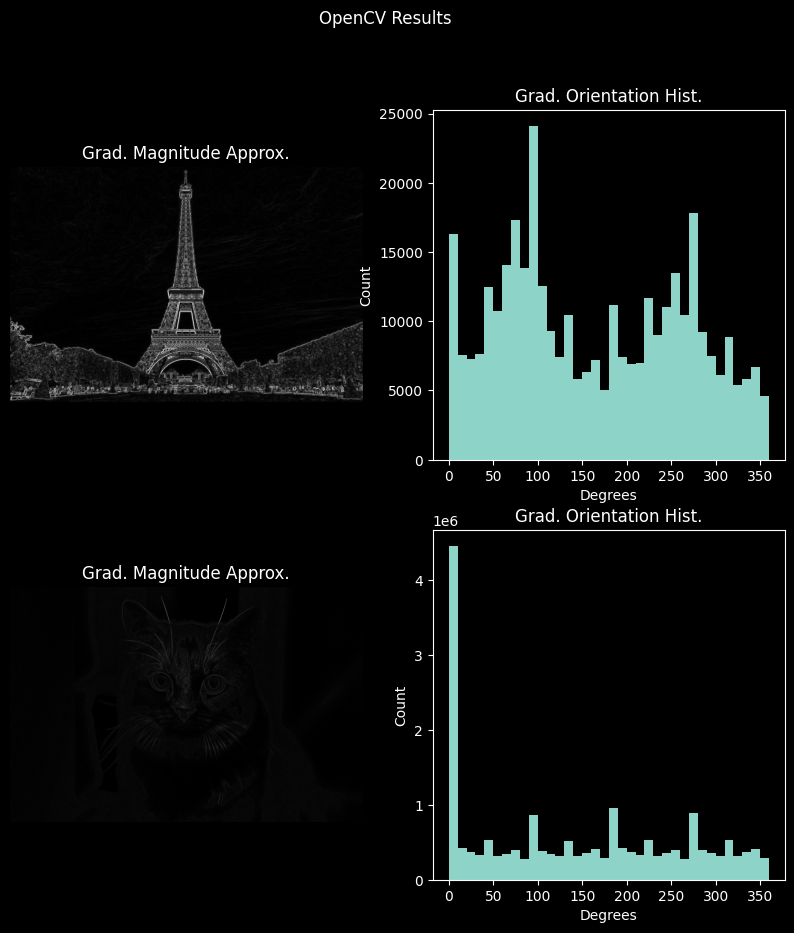

In [93]:
fig, ax = plt.subplots(2, 2, figsize=(10, 10))
for i, name in enumerate(img_names):
    ax[i, 0].imshow(grad_mag_cv[i], cmap='gray')
    ax[i, 0].set_title("Grad. Magnitude Approx.")
    ax[i, 0].set_axis_off()
    ax[i, 1].hist(grad_ori_cv[i].flatten(), bins=36, density=False)
    ax[i, 1].set_xlabel("Degrees")
    ax[i, 1].set_ylabel("Count")
    ax[i, 1].set_title("Grad. Orientation Hist.")
fig.suptitle("OpenCV Results")

In [94]:
kernel = np.array([[0, 0, 1], [0, 0, 0], [1, 0, 0]])
neighbour = np.arange(0, 9).reshape(3, 3)

print(kernel, '\n', neighbour)

[[0 0 1]
 [0 0 0]
 [1 0 0]] 
 [[0 1 2]
 [3 4 5]
 [6 7 8]]
